IMPORTING LIBRARIES:

In [10]:
import numpy as np
import pandas as pd
import rasterio
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import glob
import re
from datetime import datetime
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')

DATA LOADING AND PREPROCESSING:

In [19]:
import pandas as pd
name_width_height = pd.read_csv('namewidthheight.csv')
data_by_dimensions = pd.read_csv('databydimensions.csv')
trend_analysis = pd.read_csv('trendanalysis.csv')

print("Contents of name_width_height:")
print(name_width_height.head())
print("\nContents of data_by_dimensions:")
print(data_by_dimensions.head())
print("\nContents of trend_analysis:")
print(trend_analysis.head())

Contents of name_width_height:
                   file_name  width  height
0  KOTHRUD_APRIL2024_geo.tif   8192    4320
1    KOTHRUD_FEB2024_geo.tif   8192    4320
2    KOTHRUD_OCT2023_geo.tif   8192    4320
3    KOTHRUD_MAY2023_geo.tif   8192    4320
4    KOTHRUD_NOV2022_geo.tif   8192    4320

Contents of data_by_dimensions:
   avg_width  avg_height  max_width  max_height  min_width  min_height
0     8192.0      4320.0       8192        4320       8192        4320

Contents of trend_analysis:
  region month  year  avg_width  avg_height
0  BANER   MAY  2011     8192.0      4320.0
1  BANER   NOV  2011     8192.0      4320.0
2  BANER   MAY  2012     8192.0      4320.0
3  BANER   JAN  2013     8192.0      4320.0
4  BANER   MAR  2013     8192.0      4320.0


BOX-COUNTING ALGORITHM AND FRACTAL DIMENSIONS:

In [51]:
def load_tif_file(file_path):
    with rasterio.open(file_path) as src:
        return src.read(1)  

# calculate box count for a given box size using box-counting method
def calculate_box_count(image, box_size):
    binary_image = image > 0
    height, width = binary_image.shape
    num_boxes_height = height // box_size
    num_boxes_width = width // box_size
    box_count = 0
    
    for i in range(num_boxes_height):
        for j in range(num_boxes_width):
            box = binary_image[i*box_size:(i+1)*box_size, 
                             j*box_size:(j+1)*box_size]
            if np.any(box):
                box_count += 1
                
    return box_count

# calculating fractal dimensions using box-xounting
def calculate_fractal_dimension(image):
    box_sizes = [2**i for i in range(4, 9)]  #  16 to 256
    counts = [calculate_box_count(image, size) for size in box_sizes]
    log_sizes = np.log(box_sizes)
    log_counts = np.log(counts)
    coeffs = np.polyfit(log_sizes, log_counts, 1)
    return -coeffs[0]

def extract_date_from_filename(filename):
    match = re.search(r'_(.*?)(\d{4})_', filename)
    if match:
        month, year = match.groups()
        try:
            date_str = f"01-{month}-{year}"
            for fmt in ["%d-%B-%Y", "%d-%b-%Y"]:
                try:
                    return pd.to_datetime(date_str, format=fmt)
                except:
                    continue
        except:
            print(f"Error processing date in filename: {filename}")
            return None
    return None

class FractalAnalysis:
    def __init__(self):
        self.fractal_dimensions = pd.DataFrame()
        
    def process_region(self, region_name):
        pattern = f"{region_name}/*.tif"
        files = sorted(glob.glob(pattern))
        
        results = []
        for file in files:
            filename = Path(file).name
            date = extract_date_from_filename(filename)
            if date:
                try:
                    image_data = load_tif_file(file)
                    fractal_dim = calculate_fractal_dimension(image_data)
                    results.append({
                        'date': date,
                        'region': region_name,
                        'fractal_dimension': fractal_dim,
                        'filename': filename
                    })
                except Exception as e:
                    print(f"Error processing file {filename}: {str(e)}")
        
        return pd.DataFrame(results)

# combining results
    def analyze_all_regions(self):
        regions = ['baner', 'kothrud']
        all_results = []
        
        for region in regions:
            results = self.process_region(region)
            all_results.append(results)
        
        self.fractal_dimensions = pd.concat(all_results, ignore_index=True)
        return self.fractal_dimensions

In [52]:
# ANALYZING
analyzer = FractalAnalysis()

results = analyzer.analyze_all_regions()

results = results.sort_values('date')
print("First few results:")
print(results.head())

First few results:
         date region  fractal_dimension                 filename
21 2011-05-01  baner           2.018605    BANER_MAY2011_geo.tif
26 2011-11-01  baner           2.018605    BANER_NOV2011_geo.tif
22 2012-05-01  baner           2.018582    BANER_MAY2012_geo.tif
12 2013-01-01  baner           2.018605    BANER_JAN2013_geo.tif
19 2013-03-01  baner           2.018605  BANER_MARCH2013_geo.tif


VISUALIZING

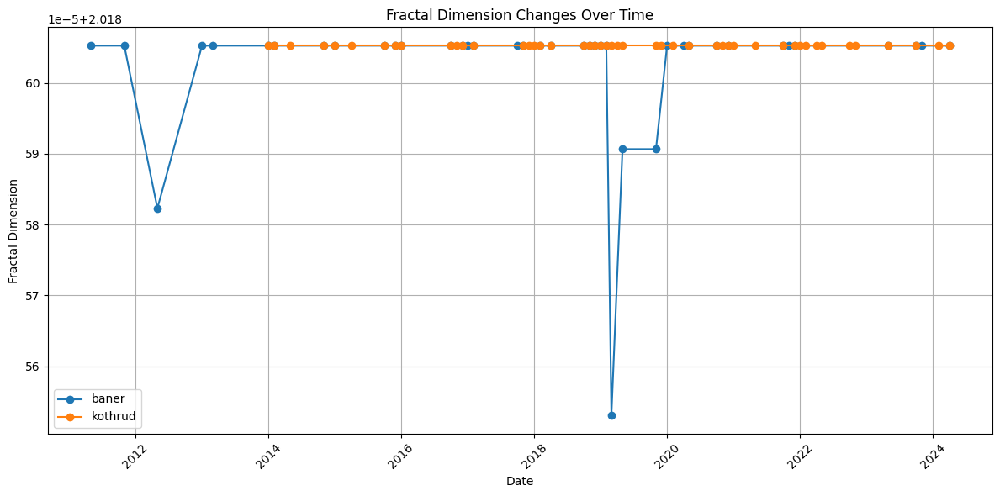

In [24]:
plt.figure(figsize=(12, 6))
for region in ['baner', 'kothrud']:
    region_data = results[results['region'] == region]
    plt.plot(region_data['date'], region_data['fractal_dimension'], 
             marker='o', label=region)

plt.title('Fractal Dimension Changes Over Time')
plt.xlabel('Date')
plt.ylabel('Fractal Dimension')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Statistical Analysis of Fractal Dimensions:
        fractal_dimension                     
                     mean  std     min     max
region                                        
baner              2.0186  0.0  2.0186  2.0186
kothrud            2.0186  0.0  2.0186  2.0186


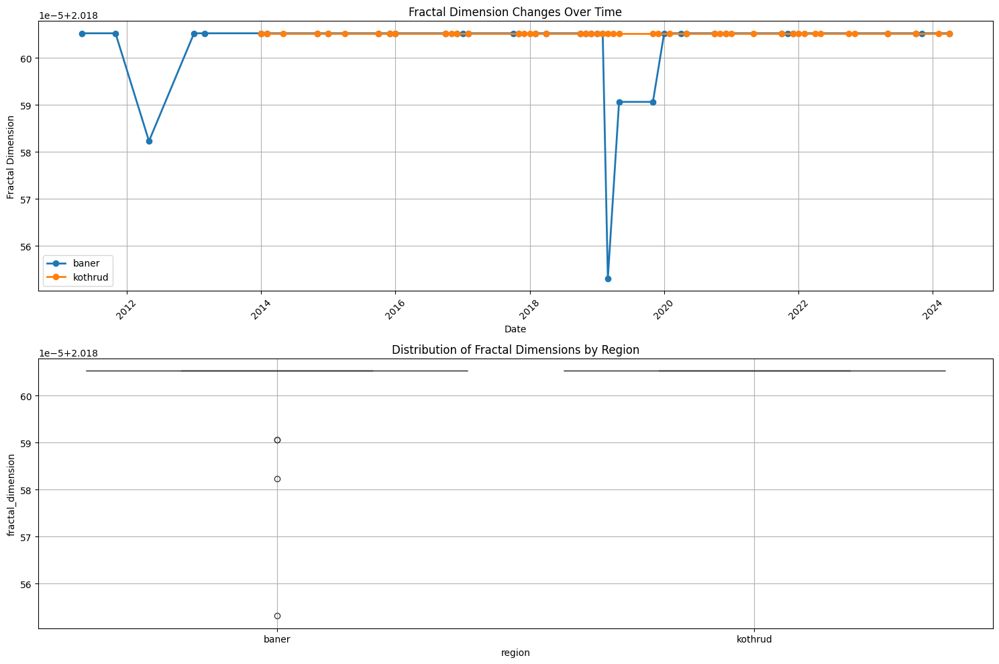


Yearly Growth Rates:
     region  year  fractal_dimension  growth_rate
1     baner  2012           2.018582    -0.001137
2     baner  2013           2.018605     0.001137
3     baner  2014           2.018605     0.000000
4     baner  2015           2.018605     0.000000
5     baner  2016           2.018605     0.000000
6     baner  2017           2.018605     0.000000
7     baner  2018           2.018605     0.000000
8     baner  2019           2.018589    -0.000807
9     baner  2020           2.018605     0.000807
10    baner  2021           2.018605     0.000000
11    baner  2023           2.018605     0.000000
12    baner  2024           2.018605     0.000000
14  kothrud  2015           2.018605     0.000000
15  kothrud  2016           2.018605     0.000000
16  kothrud  2017           2.018605     0.000000
17  kothrud  2018           2.018605     0.000000
18  kothrud  2019           2.018605     0.000000
19  kothrud  2020           2.018605     0.000000
20  kothrud  2021           

In [53]:
# basic statistics for each region
stats = results.groupby('region').agg({
    'fractal_dimension': ['mean', 'std', 'min', 'max']
}).round(4)

print("Statistical Analysis of Fractal Dimensions:")
print(stats)

plt.figure(figsize=(15, 10))

plt.subplot(2, 1, 1)
# time series plot
for region in ['baner', 'kothrud']:
    region_data = results[results['region'] == region]
    plt.plot(region_data['date'], region_data['fractal_dimension'], 
             marker='o', label=region, linewidth=2)

plt.title('Fractal Dimension Changes Over Time')
plt.xlabel('Date')
plt.ylabel('Fractal Dimension')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)

plt.subplot(2, 1, 2)
sns.boxplot(x='region', y='fractal_dimension', data=results)
plt.title('Distribution of Fractal Dimensions by Region')
plt.grid(True)

plt.tight_layout()
plt.show()

results['year'] = results['date'].dt.year
yearly_avg = results.groupby(['region', 'year'])['fractal_dimension'].mean().reset_index()

yearly_avg['growth_rate'] = yearly_avg.groupby('region')['fractal_dimension'].pct_change() * 100

print("\nYearly Growth Rates:")
print(yearly_avg[yearly_avg['growth_rate'].notna()])

LSTM FOR PREDICTION


Training model for baner
Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 31s 31s/step - loss: 0.9790 - val_loss: 0.9444
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.9605 - val_loss: 0.9223
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.9266 - val_loss: 0.9011
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.9133 - val_loss: 0.8800
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.8848 - val_loss: 0.8593
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.8665 - val_loss: 0.8393
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.8525 - val_loss: 0.8189
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.8292 - val_loss: 0.7975
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.8076 - val_loss: 0.7752
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.7687 - val_loss: 0.7517
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step - loss: 0.7544 - val_loss: 0.7274
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms

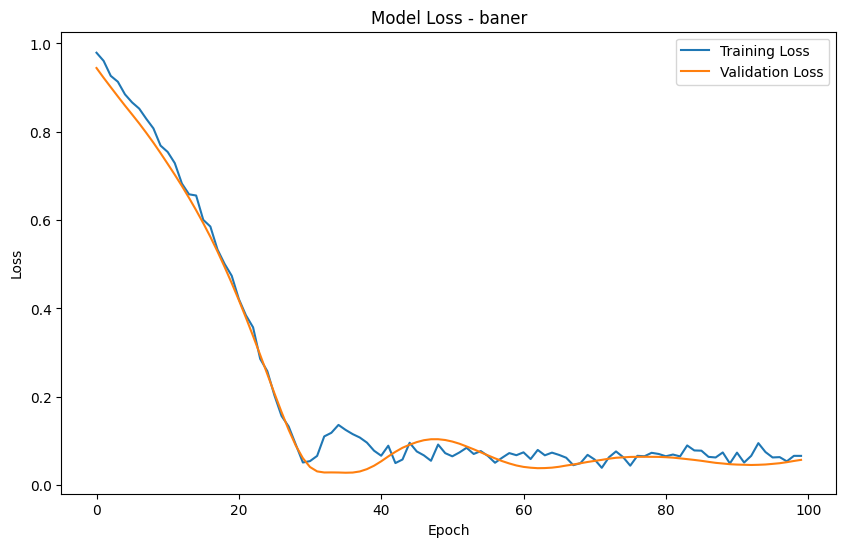


Training model for kothrud
Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - 

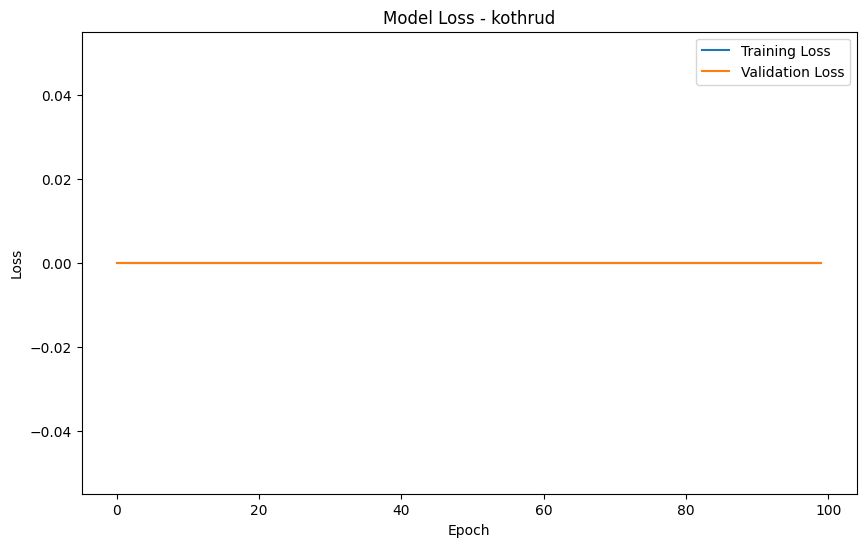

In [54]:
def prepare_lstm_data(data, region_name, sequence_length=6):
    region_data = data[data['region'] == region_name].sort_values('date')
    
    scaler = MinMaxScaler()
    scaled_values = scaler.fit_transform(region_data[['fractal_dimension']])
    
    X, y = [], []
    for i in range(len(scaled_values) - sequence_length):
        X.append(scaled_values[i:(i + sequence_length)])
        y.append(scaled_values[i + sequence_length])
    
    return np.array(X), np.array(y), scaler

def create_lstm_model(sequence_length):
    model = Sequential([
        LSTM(50, activation='relu', input_shape=(sequence_length, 1), return_sequences=True),
        Dropout(0.2),
        LSTM(50, activation='relu'),
        Dropout(0.2),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    return model

sequence_length = 6
regions_models = {}

for region in ['baner', 'kothrud']:
    print(f"\nTraining model for {region}")
    X, y, scaler = prepare_lstm_data(results, region, sequence_length)
    
    if len(X) > 0: 
        train_size = int(len(X) * 0.8)
        X_train, X_test = X[:train_size], X[train_size:]
        y_train, y_test = y[:train_size], y[train_size:]
        
        model = create_lstm_model(sequence_length)
        history = model.fit(
            X_train, y_train,
            epochs=100,
            batch_size=32,
            validation_split=0.2,
            verbose=1
        )
        
        regions_models[region] = {
            'model': model,
            'scaler': scaler,
            'history': history
        }
        
        plt.figure(figsize=(10, 6))
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model Loss - {region}')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

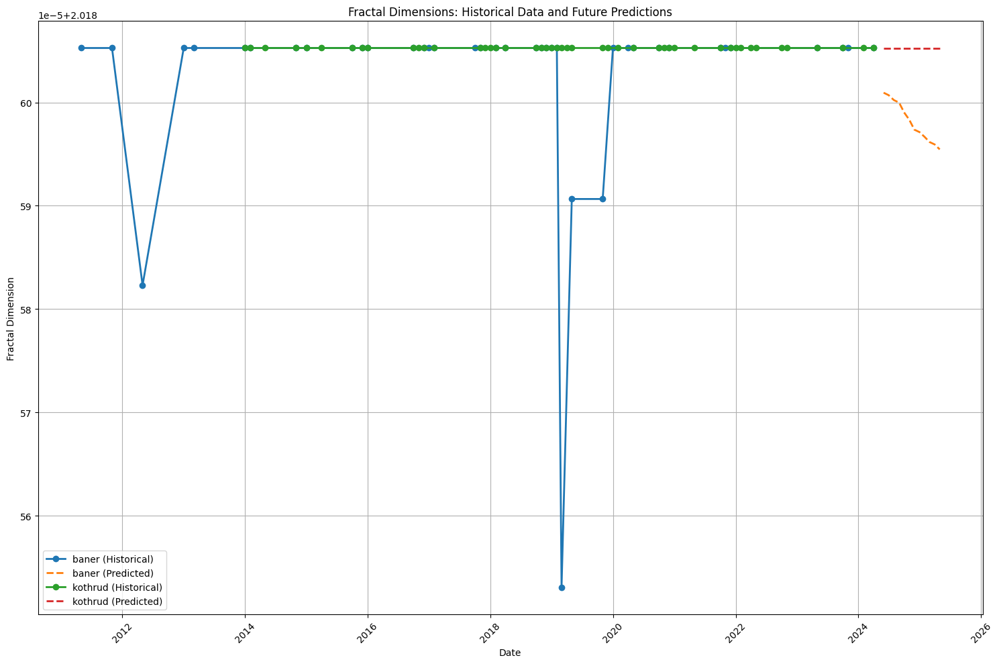


Predicted Fractal Dimensions for Next 12 Months:

Baner Predictions:
2024-05: 2.0186
2024-06: 2.0186
2024-07: 2.0186
2024-08: 2.0186
2024-09: 2.0186
2024-10: 2.0186
2024-11: 2.0186
2024-12: 2.0186
2025-01: 2.0186
2025-02: 2.0186
2025-03: 2.0186
2025-04: 2.0186

Kothrud Predictions:
2024-05: 2.0186
2024-06: 2.0186
2024-07: 2.0186
2024-08: 2.0186
2024-09: 2.0186
2024-10: 2.0186
2024-11: 2.0186
2024-12: 2.0186
2025-01: 2.0186
2025-02: 2.0186
2025-03: 2.0186
2025-04: 2.0186

Growth Analysis:

Baner:
Current Fractal Dimension: 2.0186
Predicted Fractal Dimension (after 12 months): 2.0186
Predicted Growth Rate: -0.00%

Kothrud:
Current Fractal Dimension: 2.0186
Predicted Fractal Dimension (after 12 months): 2.0186
Predicted Growth Rate: -0.00%


In [55]:
def make_predictions(region, model_dict, last_sequence, num_future_steps=12):
    model = model_dict['model']
    scaler = model_dict['scaler']
    
    predictions = []
    current_sequence = last_sequence.copy()
    
    for _ in range(num_future_steps):
        next_pred = model.predict(current_sequence.reshape(1, 6, 1), verbose=0)
        predictions.append(next_pred[0, 0])
        
        current_sequence = np.roll(current_sequence, -1)
        current_sequence[-1] = next_pred
        
    predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
    return predictions.flatten()

last_date = results['date'].max()
future_dates = pd.date_range(start=last_date, periods=13, freq='M')[1:]

future_predictions = {}
for region in regions_models.keys():
    region_data = results[results['region'] == region].sort_values('date')
    scaled_data = regions_models[region]['scaler'].transform(region_data[['fractal_dimension']])
    last_sequence = scaled_data[-6:]
    
    predictions = make_predictions(region, regions_models[region], last_sequence)
    future_predictions[region] = predictions

plt.figure(figsize=(15, 10))

for region in ['baner', 'kothrud']:
    region_data = results[results['region'] == region]
    plt.plot(region_data['date'], region_data['fractal_dimension'], 
             marker='o', label=f'{region} (Historical)', linewidth=2)
    
    if region in future_predictions:
        plt.plot(future_dates, future_predictions[region], 
                '--', label=f'{region} (Predicted)', linewidth=2)

plt.title('Fractal Dimensions: Historical Data and Future Predictions')
plt.xlabel('Date')
plt.ylabel('Fractal Dimension')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nPredicted Fractal Dimensions for Next 12 Months:")
for region in future_predictions:
    print(f"\n{region.capitalize()} Predictions:")
    for date, pred in zip(future_dates, future_predictions[region]):
        print(f"{date.strftime('%Y-%m')}: {pred:.4f}")

print("\nGrowth Analysis:")
for region in future_predictions:
    current_fd = results[results['region'] == region]['fractal_dimension'].iloc[-1]
    final_pred_fd = future_predictions[region][-1]
    growth_rate = ((final_pred_fd - current_fd) / current_fd) * 100
    print(f"\n{region.capitalize()}:")
    print(f"Current Fractal Dimension: {current_fd:.4f}")
    print(f"Predicted Fractal Dimension (after 12 months): {final_pred_fd:.4f}")
    print(f"Predicted Growth Rate: {growth_rate:.2f}%")

FINAL SUMMARY

In [56]:
analysis_summary = {
    'Historical Analysis': {},
    'Prediction Analysis': {},
    'Growth Patterns': {}
}

for region in ['baner', 'kothrud']:
    region_data = results[results['region'] == region]
    
    analysis_summary['Historical Analysis'][region] = {
        'Mean Fractal Dimension': region_data['fractal_dimension'].mean(),
        'Standard Deviation': region_data['fractal_dimension'].std(),
        'Total Growth': ((region_data['fractal_dimension'].iloc[-1] / 
                         region_data['fractal_dimension'].iloc[0]) - 1) * 100,
        'Data Period': f"{region_data['date'].min().strftime('%Y-%m')} to {region_data['date'].max().strftime('%Y-%m')}"
    }

print("\nComprehensive Analysis Summary:")
print("\nHistorical Analysis:")
for region in analysis_summary['Historical Analysis']:
    print(f"\n{region.capitalize()}:")
    for metric, value in analysis_summary['Historical Analysis'][region].items():
        if isinstance(value, float):
            print(f"{metric}: {value:.4f}")
        else:
            print(f"{metric}: {value}")


Comprehensive Analysis Summary:

Historical Analysis:

Baner:
Mean Fractal Dimension: 2.0186
Standard Deviation: 0.0000
Total Growth: 0.0000
Data Period: 2011-05 to 2024-04

Kothrud:
Mean Fractal Dimension: 2.0186
Standard Deviation: 0.0000
Total Growth: 0.0000
Data Period: 2014-01 to 2024-04


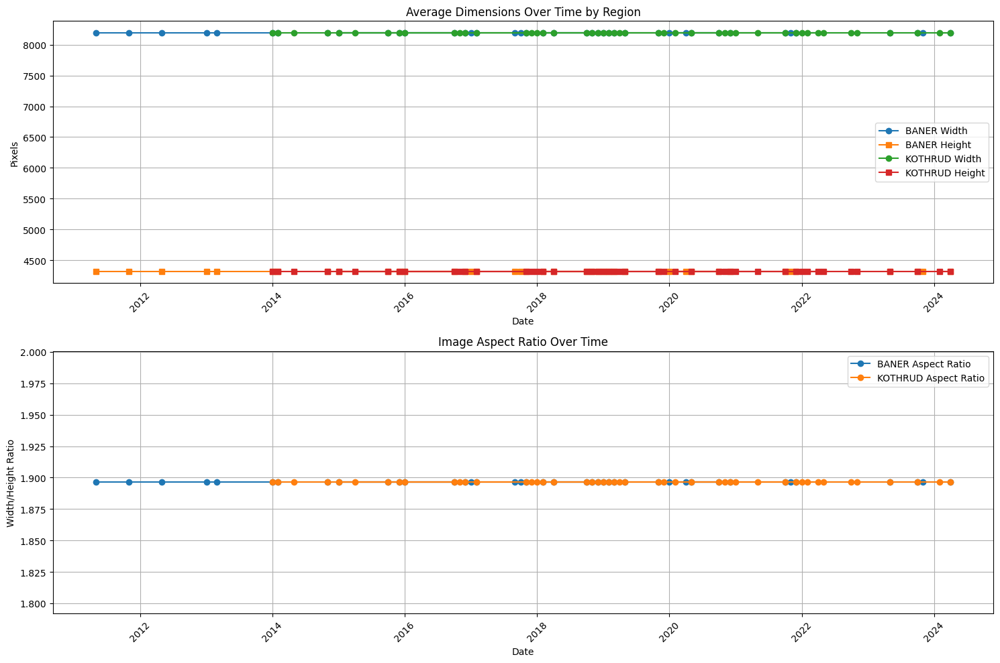


Dimensional Statistics by Region:
        avg_width                      avg_height                       \
             mean  std     min     max       mean  std     min     max   
region                                                                   
BANER      8192.0  0.0  8192.0  8192.0     4320.0  0.0  4320.0  4320.0   
KOTHRUD    8192.0  0.0  8192.0  8192.0     4320.0  0.0  4320.0  4320.0   

        aspect_ratio                 
                mean  std  min  max  
region                               
BANER            1.9  0.0  1.9  1.9  
KOTHRUD          1.9  0.0  1.9  1.9  

Correlation Analysis:
Empty DataFrame
Columns: [date, region, fractal_dimension, filename, year_x, month, year_y, avg_width, avg_height, aspect_ratio, year]
Index: []


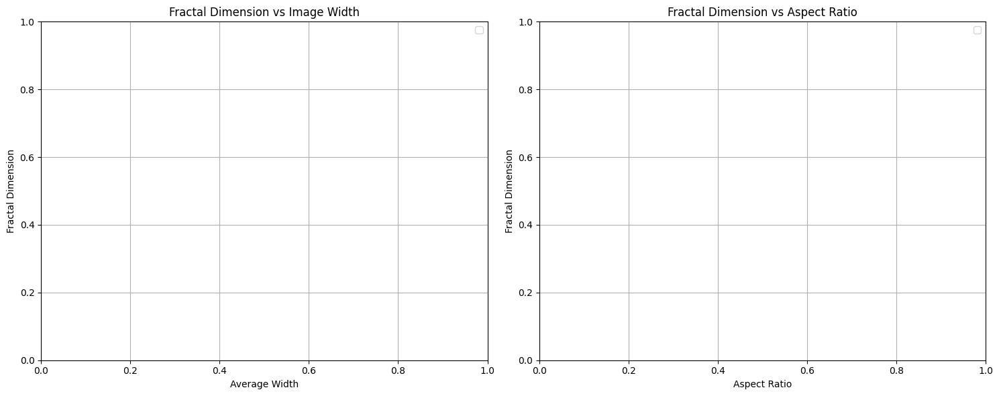


Temporal Analysis:
Empty DataFrame
Columns: [fractal_dimension, avg_width, avg_height, aspect_ratio]
Index: []


In [57]:
trend_df = trend_analysis.copy()
trend_df['date'] = pd.to_datetime(trend_df['year'].astype(str) + '-' + trend_df['month'], format='%Y-%b')

plt.figure(figsize=(15, 10))

plt.subplot(2, 1, 1)
for region in ['BANER', 'KOTHRUD']:
    region_data = trend_df[trend_df['region'] == region]
    plt.plot(region_data['date'], region_data['avg_width'], 
             label=f'{region} Width', marker='o')
    plt.plot(region_data['date'], region_data['avg_height'], 
             label=f'{region} Height', marker='s')

plt.title('Average Dimensions Over Time by Region')
plt.xlabel('Date')
plt.ylabel('Pixels')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)

plt.subplot(2, 1, 2)
trend_df['aspect_ratio'] = trend_df['avg_width'] / trend_df['avg_height']
for region in ['BANER', 'KOTHRUD']:
    region_data = trend_df[trend_df['region'] == region]
    plt.plot(region_data['date'], region_data['aspect_ratio'], 
             label=f'{region} Aspect Ratio', marker='o')

plt.title('Image Aspect Ratio Over Time')
plt.xlabel('Date')
plt.ylabel('Width/Height Ratio')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

print("\nDimensional Statistics by Region:")
dimensional_stats = trend_df.groupby('region').agg({
    'avg_width': ['mean', 'std', 'min', 'max'],
    'avg_height': ['mean', 'std', 'min', 'max'],
    'aspect_ratio': ['mean', 'std', 'min', 'max']
}).round(2)
print(dimensional_stats)

merged_analysis = pd.merge(
    results,
    trend_df,
    left_on=['date', 'region'],
    right_on=['date', 'region'],
    how='inner'
)

merged_analysis['year'] = merged_analysis['date'].dt.year

print("\nCorrelation Analysis:")
correlations = merged_analysis.groupby('region').apply(
    lambda x: x[['fractal_dimension', 'avg_width', 'avg_height', 'aspect_ratio']].corr()
).round(3)
print(correlations)

plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
for region in merged_analysis['region'].unique():
    region_data = merged_analysis[merged_analysis['region'] == region]
    plt.scatter(region_data['avg_width'], region_data['fractal_dimension'], 
                label=region, alpha=0.6)
plt.xlabel('Average Width')
plt.ylabel('Fractal Dimension')
plt.title('Fractal Dimension vs Image Width')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
for region in merged_analysis['region'].unique():
    region_data = merged_analysis[merged_analysis['region'] == region]
    plt.scatter(region_data['aspect_ratio'], region_data['fractal_dimension'], 
                label=region, alpha=0.6)
plt.xlabel('Aspect Ratio')
plt.ylabel('Fractal Dimension')
plt.title('Fractal Dimension vs Aspect Ratio')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

print("\nTemporal Analysis:")
yearly_stats = merged_analysis.groupby(['region', 'year']).agg({
    'fractal_dimension': 'mean',
    'avg_width': 'mean',
    'avg_height': 'mean',
    'aspect_ratio': 'mean'
}).round(4)
print(yearly_stats)

Analyzing Baner:


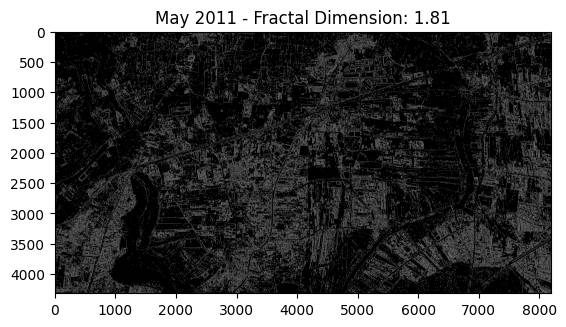

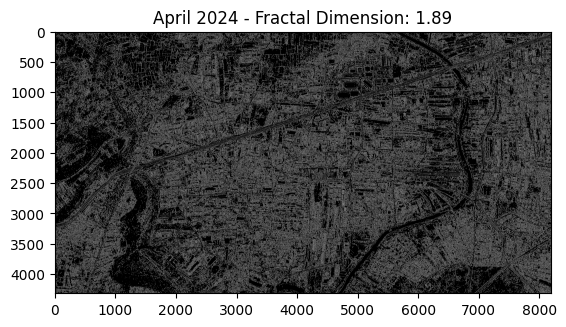

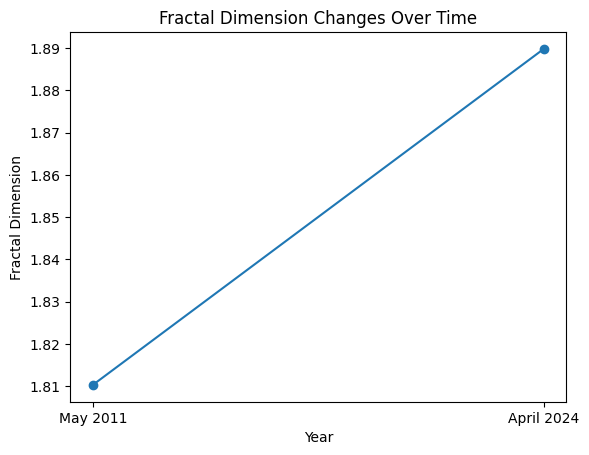


Analyzing Kothrud:


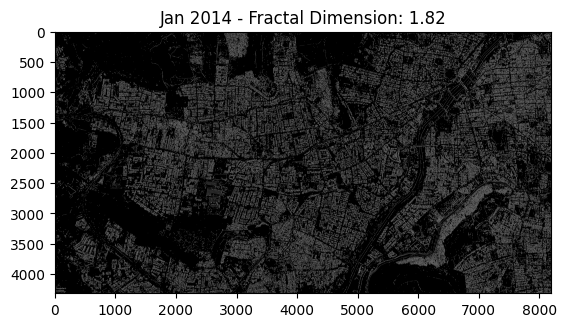

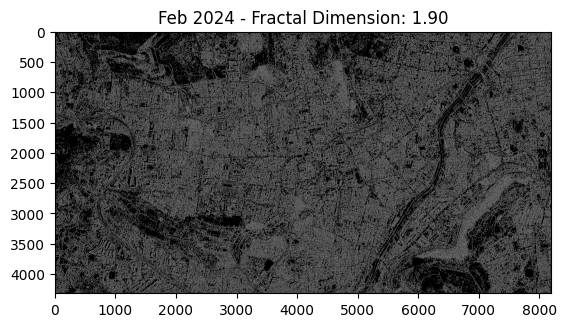

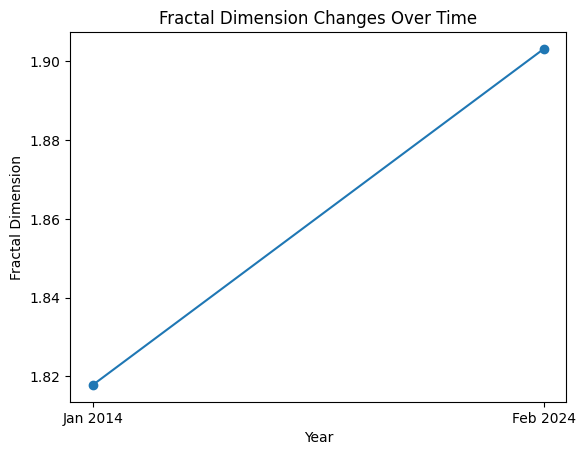

In [35]:
import cv2
import numpy as np
import rasterio
import matplotlib.pyplot as plt

# Function to load geo-referenced images using rasterio
def load_geotiff_image(file_path):
    with rasterio.open(file_path) as dataset:
        img = dataset.read(1)  # Read the first band
    return img

# Function to calculate fractal dimension using box counting
def fractal_dimension(Z, threshold=128):
    def boxcount(Z, k):
        S = np.add.reduceat(
            np.add.reduceat(Z, np.arange(0, Z.shape[0], k), axis=0),
                               np.arange(0, Z.shape[1], k), axis=1)
        return len(np.where((S > 0) & (S < k*k))[0])

    Z = (Z < threshold)
    p = min(Z.shape)
    n = 2**np.floor(np.log2(p))
    sizes = 2**np.arange(int(np.log2(n)), 1, -1)
    counts = np.array([boxcount(Z, size) for size in sizes])
    coeffs = np.polyfit(np.log(sizes), np.log(counts), 1)
    return -coeffs[0]

# Update the paths to include the folders 'baner' and 'kothrud'
baner_images = {
    "May 2011": "baner/BANER_MAY2011_geo.tif",
    "April 2024": "baner/BANER_APRIL2024_geo.tif"
}
kothrud_images = {
    "Jan 2014": "kothrud/KOTHRUD_JAN2014_geo.tif",
    "Feb 2024": "kothrud/KOTHRUD_FEB2024_geo.tif"
}

# Function to analyze fractal changes
def analyze_fractal_changes(image_paths):
    years = []
    fractal_dimensions = []
    
    for year, path in image_paths.items():
        img = load_geotiff_image(path)
        
        # Convert to grayscale if it's not already
        if len(img.shape) == 3:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Edge detection using Canny (tunable thresholds)
        edges = cv2.Canny(img, 100, 200)
        
        # Compute fractal dimension
        fractal_dim = fractal_dimension(edges)
        years.append(year)
        fractal_dimensions.append(fractal_dim)
        
        # Show processed image (Optional)
        plt.imshow(edges, cmap='gray')
        plt.title(f"{year} - Fractal Dimension: {fractal_dim:.2f}")
        plt.show()
    
    # Plot fractal dimension changes over time
    plt.plot(years, fractal_dimensions, marker='o')
    plt.xlabel("Year")
    plt.ylabel("Fractal Dimension")
    plt.title("Fractal Dimension Changes Over Time")
    plt.show()

# Run analysis for Baner and Kothrud
print("Analyzing Baner:")
analyze_fractal_changes(baner_images)

print("\nAnalyzing Kothrud:")
analyze_fractal_changes(kothrud_images)

OVERLAY FRACTAL BOUNDARIES ON IMAGES

baner images with fractal boundaries:


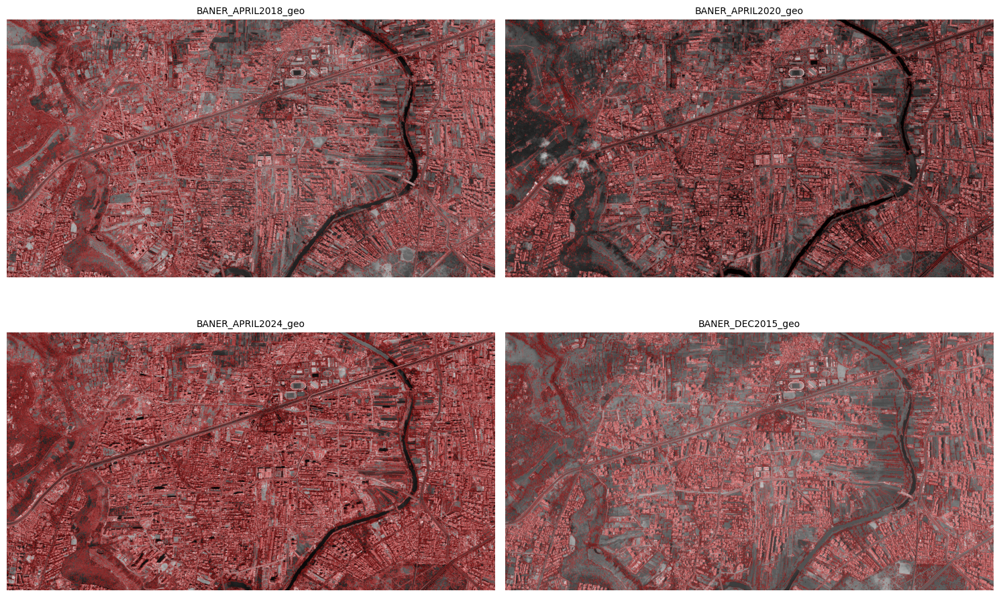

kothrud images with fractal boundaries:


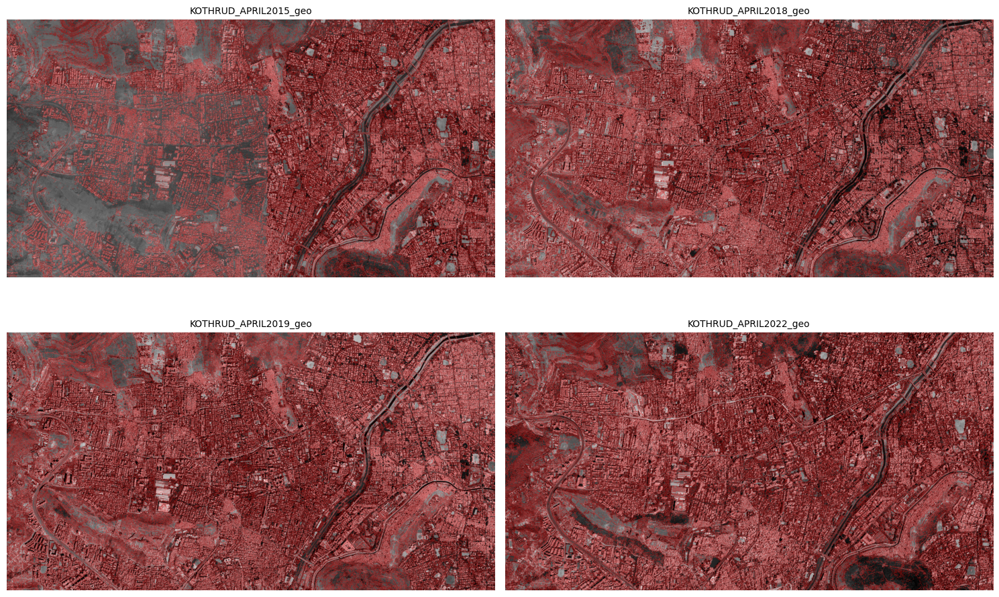

In [58]:
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
import rasterio

def load_image(file_path):
    with rasterio.open(file_path) as src:
        return src.read(1)

def overlay_fractal_edges(image, edge_threshold1=50, edge_threshold2=150):
    edges = cv2.Canny(image, edge_threshold1, edge_threshold2)
    
    colored_image = cv2.cvtColor((image * (255 / image.max())).astype('uint8'), cv2.COLOR_GRAY2BGR)
    
    colored_image[edges > 0] = [255, 0, 0]
    
    return colored_image

def plot_images_with_edges(region_folder, num_images=4):
    files = sorted(Path(region_folder).glob("*.tif"))
    plt.figure(figsize=(15, 10))
    
    for i, file in enumerate(files[:num_images]):
        image_data = load_image(file)
        image_with_edges = overlay_fractal_edges(image_data)
        
        plt.subplot(2, 2, i + 1)
        plt.imshow(image_with_edges)
        plt.title(file.stem, fontsize=10)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

print("baner images with fractal boundaries:")
plot_images_with_edges('baner')

print("kothrud images with fractal boundaries:")
plot_images_with_edges('kothrud')

baner images with fractal grid overlay:


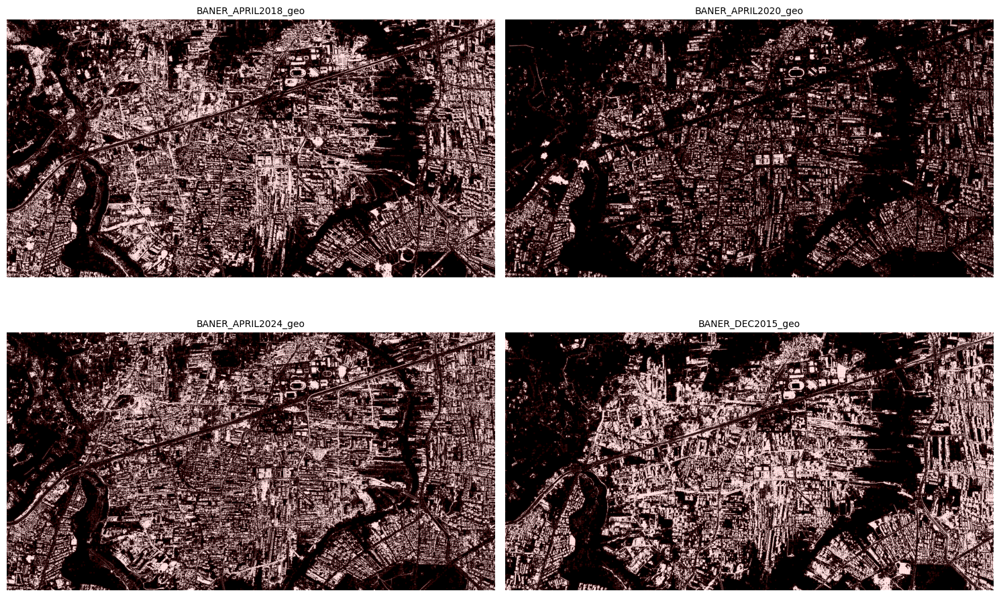

kothrud images with fractal grid overlay:


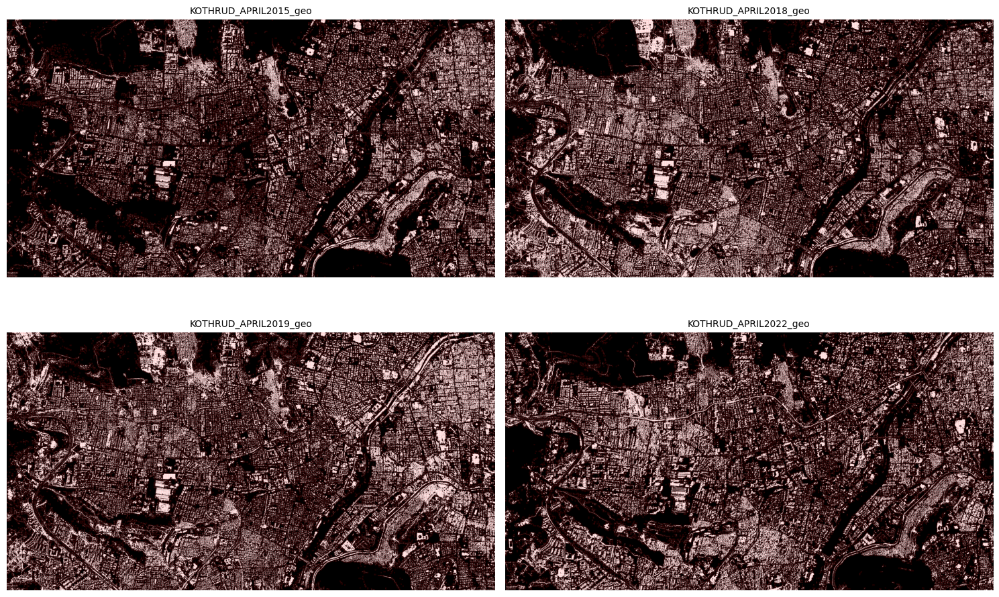

In [38]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
import rasterio

# function to load a tif file and return the image data
def load_image(file_path):
    with rasterio.open(file_path) as src:
        return src.read(1)

# function to create a binary image, simplifying fractal structures
def create_binary_image(image, threshold=127):
    # normalize and apply threshold
    normalized_image = (image * (255 / image.max())).astype('uint8')
    _, binary_image = cv2.threshold(normalized_image, threshold, 255, cv2.THRESH_BINARY)
    return binary_image

# function to overlay a grid on the binary image for box-counting-like visualization
def overlay_fractal_grid(binary_image, box_size=16):
    # create a color overlay for the binary image
    colored_image = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)
    height, width = binary_image.shape

    # draw grid boxes
    for y in range(0, height, box_size):
        for x in range(0, width, box_size):
            box = binary_image[y:y + box_size, x:x + box_size]
            # highlight non-empty boxes in red to indicate fractal-like areas
            if np.any(box):  # check if there's a filled part in the box
                cv2.rectangle(colored_image, (x, y), (x + box_size, y + box_size), (255, 0, 0), 1)
    return colored_image

# load, process, and display images with grid overlay highlighting fractal structures
def plot_images_with_fractal_grid(region_folder, num_images=4):
    files = sorted(Path(region_folder).glob("*.tif"))
    plt.figure(figsize=(15, 10))
    
    for i, file in enumerate(files[:num_images]):
        image_data = load_image(file)
        binary_image = create_binary_image(image_data)
        image_with_grid = overlay_fractal_grid(binary_image)

        plt.subplot(2, 2, i + 1)
        plt.imshow(image_with_grid)
        plt.title(file.stem, fontsize=10)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# run for baner and kothrud folders
print("baner images with fractal grid overlay:")
plot_images_with_fractal_grid('baner')

print("kothrud images with fractal grid overlay:")
plot_images_with_fractal_grid('kothrud')

COLOR MAPPING BASED ON FRACTAL DIMENSION

In [59]:
def generate_fractal_heatmap(image_data, fractal_dimension, output_path):
    downsample_factor = 4  # downsampling factor
    downsampled_image = image_data[::downsample_factor, ::downsample_factor]
    
    plt.figure(figsize=(12, 12))
    heatmap = plt.imshow(downsampled_image, cmap='hot', alpha=0.5, interpolation='nearest', vmin=0, vmax=1)
    plt.colorbar(heatmap, label='Fractal Dimension')
    plt.title(f'Fractal Dimension Heatmap')
    plt.axis('off')
    plt.savefig(output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

output_dir = Path('heatmaps')
output_dir.mkdir(exist_ok=True)

for index, row in results.iterrows():
    region = row['region']
    image_file = Path(row['filename'])
    
    image_path = Path(region) / image_file
    fractal_dim = row['fractal_dimension']
    
    try:
        image_data = load_tif_file(image_path)  
        heatmap_output = output_dir / f"{image_file.stem}_heatmap.png"
        
        generate_fractal_heatmap(image_data, fractal_dim, heatmap_output)
    except Exception as e:
        print(f"Error processing {image_path}: {str(e)}")

print("Heatmaps generation attempt completed.")

Heatmaps generation attempt completed.


Visualizing Baner:


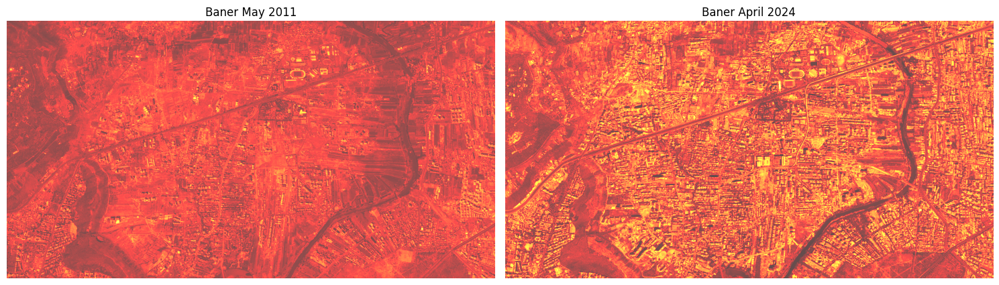

Visualizing Kothrud:


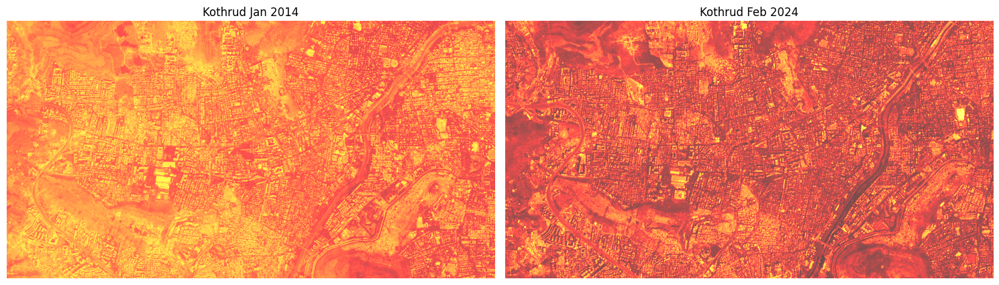

In [60]:
import matplotlib.pyplot as plt
import rasterio
from pathlib import Path
import glob

def plot_comparative_density_images(region, years, titles):

    fig, axs = plt.subplots(1, len(years), figsize=(15, 5))
    
    for ax, year, title in zip(axs, years, titles):
        file_path = Path(region) / f"{region.upper()}_{year}_geo.tif"
        
        try:
            with rasterio.open(file_path) as src:
                image_data = src.read(1)  # read the first band
                
            ax.imshow(image_data, cmap='hot', alpha=0.7)
            ax.set_title(title)
            ax.axis('off') 
        
        except Exception as e:
            print(f"Error loading {file_path}: {str(e)}")
            ax.set_title("Image not found")
            ax.axis('off') 
    
    plt.tight_layout()
    plt.show()

baner_years = ['MAY2011', 'APRIL2024']
kothrud_years = ['JAN2014', 'FEB2024']
baner_titles = ['Baner May 2011', 'Baner April 2024']
kothrud_titles = ['Kothrud Jan 2014', 'Kothrud Feb 2024']

# plot for Baner
print("Visualizing Baner:")
plot_comparative_density_images('baner', baner_years, baner_titles)

# plot for Kothrud
print("Visualizing Kothrud:")
plot_comparative_density_images('kothrud', kothrud_years, kothrud_titles)

TRAINING A MACHINE LEARNING MODEL FOR PREDICTION

In [61]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# create features and labels
X = results[['fractal_dimension']]  
y = results['region']  

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[1 8]
 [0 9]]

Classification Report:
              precision    recall  f1-score   support

       baner       1.00      0.11      0.20         9
     kothrud       0.53      1.00      0.69         9

    accuracy                           0.56        18
   macro avg       0.76      0.56      0.45        18
weighted avg       0.76      0.56      0.45        18



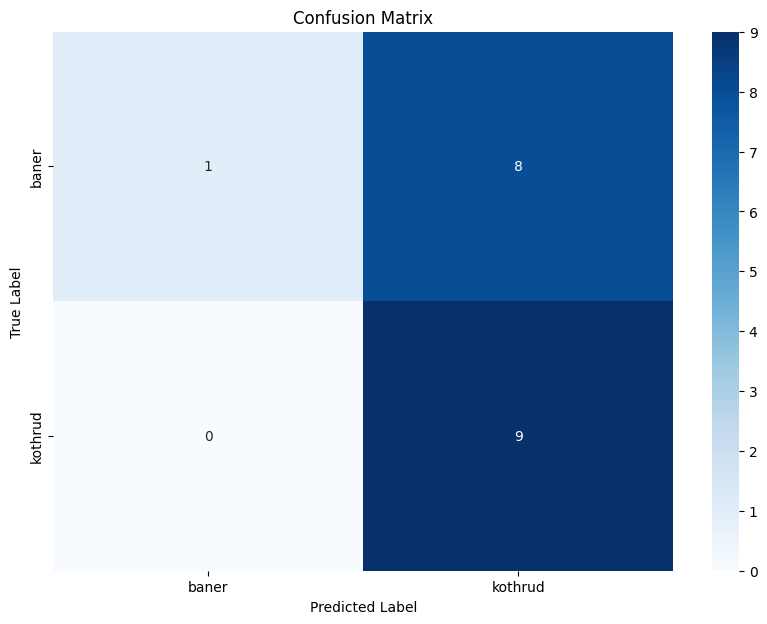

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=rf_model.classes_, yticklabels=rf_model.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()